In [2]:
import os
import cv2
import matplotlib.pyplot as plt
import random
from ultralytics import YOLO
from pathlib import Path

CLASS_NAMES = {
    0: "Car",
    1: "Truck",
    2: "Bus",
    3: "Motorcycle",
    4: "Bicycle",
    5: "TrafficSigns",
    6: "TrafficLight",
    7: "Pedestrians",
}

CLASS_COLORS = {
    0: (63, 0, 255),    # Neon Red
    1: (255, 123, 0),  # Electric Blue
    2: (0, 255, 0),    # Lime Green
    3: (0, 215, 255),  # Vibrant Yellow
    4: (255, 0, 255),  # Bright Magenta
    5: (255, 255, 0),  # Cyan / Aqua
    6: (0, 103, 255),  # Vivid Orange
    7: (255, 0, 157)   # Hot Purple
}

YOLO_DATASET = "yolo_kitti_dataset"

## Inspect one frame from the YOLO dataset (optional)

In [18]:
def _matches_frame_name(path, frame_idx):
    stem = os.path.splitext(os.path.basename(path))[0]
    frame_token = str(frame_idx)
    return (
        stem == frame_token
        or stem.endswith(f"frame_{frame_token}")
        or stem.endswith(f"_{frame_token}")
        or stem.endswith(f"frame{frame_token}")
    )


def visualize_yolo_frame(yolo_dir, frame_idx, show=True, output_path=None):
    """Show a single image from a YOLO training directory with its bounding boxes."""
    frame_idx = str(frame_idx)
    yolo_dir = os.path.abspath(yolo_dir)

    if not os.path.isdir(yolo_dir):
        raise FileNotFoundError(f"YOLO directory not found: {yolo_dir}")

    image_candidates = []
    for root, _, files in os.walk(yolo_dir):
        for filename in files:
            if filename.lower().endswith((".png")):
                if _matches_frame_name(filename, frame_idx):
                    image_candidates.append(os.path.join(root, filename))

    if not image_candidates:
        raise FileNotFoundError(f"No image found for frame index {frame_idx} under {yolo_dir}")

    image_path = image_candidates[0]
    image_stem = os.path.splitext(os.path.basename(image_path))[0]

    label_path = None
    for root, _, files in os.walk(yolo_dir):
        for filename in files:
            if filename == f"{image_stem}.txt":
                label_path = os.path.join(root, filename)
                break
        if label_path:
            break

    if label_path is None:
        for root, _, files in os.walk(yolo_dir):
            for filename in files:
                if filename == "labels.txt":
                    label_path = os.path.join(root, filename)
                    break
            if label_path:
                break

    if label_path is None:
        raise FileNotFoundError(f"No label file found for frame index {frame_idx} under {yolo_dir}")

    img = cv2.imread(image_path)
    if img is None:
        raise FileNotFoundError(f"Could not read image: {image_path}")

    img_h, img_w = img.shape[:2]

    with open(label_path, "r") as f:
        lines = [line.strip() for line in f if line.strip()]

    for line in lines:
        parts = line.split()
        if len(parts) < 5:
            continue

        try:
            class_id = int(float(parts[0]))
            x_center, y_center, box_w, box_h = map(float, parts[1:5])
        except ValueError:
            continue

        if class_id not in CLASS_NAMES:
            continue

        if max(abs(x_center), abs(y_center), abs(box_w), abs(box_h)) <= 1.0:
            x_min = int((x_center - box_w / 2.0) * img_w)
            y_min = int((y_center - box_h / 2.0) * img_h)
            x_max = int((x_center + box_w / 2.0) * img_w)
            y_max = int((y_center + box_h / 2.0) * img_h)
        else:
            x_min = int(x_center)
            y_min = int(y_center)
            x_max = int(x_center + box_w)
            y_max = int(y_center + box_h)

        x_min = max(0, min(img_w - 1, x_min))
        y_min = max(0, min(img_h - 1, y_min))
        x_max = max(0, min(img_w - 1, x_max))
        y_max = max(0, min(img_h - 1, y_max))

        color = CLASS_COLORS.get(class_id, (255, 255, 255))
        cv2.rectangle(img, (x_min, y_min), (x_max, y_max), color, 2)
        label_text = CLASS_NAMES[class_id]
        cv2.putText(
            img,
            label_text,
            (x_min, max(y_min - 5, 10)),
            cv2.FONT_HERSHEY_SIMPLEX,
            0.5,
            color,
            1,
        )
        print(label_text)

    if output_path is not None:
        os.makedirs(os.path.dirname(output_path), exist_ok=True)
        cv2.imwrite(output_path, img)
        print(f"Saved visualization to {output_path}")

    if show:
        plt.figure(figsize=(12, 8))
        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        plt.axis("off")
        plt.title(f"Frame {frame_idx} - {os.path.basename(image_path)}")
        plt.show()


Car
Car
Pedestrians
Car
Car
TrafficLight
TrafficSigns


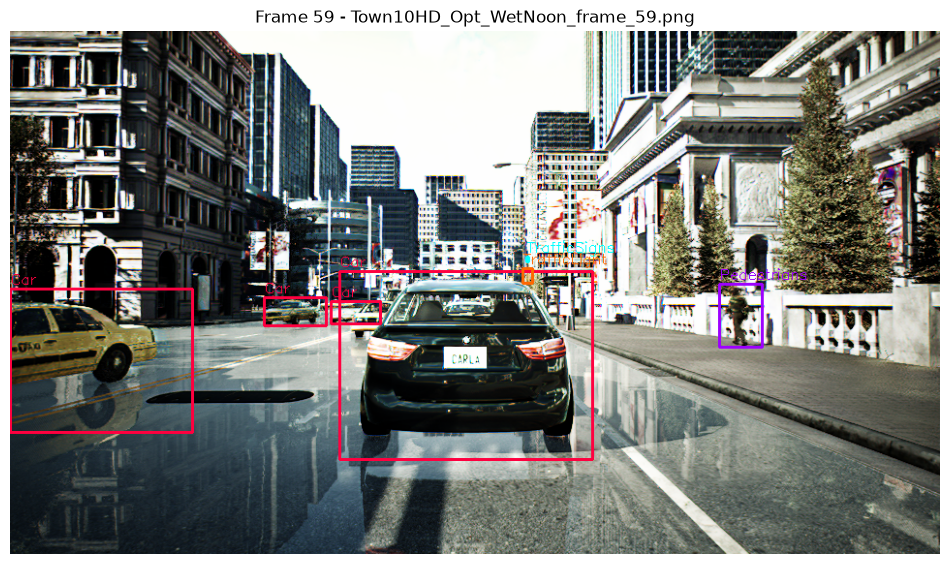

In [ ]:
frame_idx = random.randint(1, 300)
visualize_yolo_frame(f"./{YOLO_DATASET}/train", frame_idx)

## Fine-tune YOLOv8

In [35]:

EPOCHS = 50
BATCH = 16
IMGSZ = 640
MODEL = "yolov8n.pt"  # yolov8s.pt for more accuracy, slower
DEVICE = 0

data_yaml = Path(YOLO_DATASET) / "dataset.yaml"
assert data_yaml.is_file(), f"Missing {data_yaml} — run prepare_yolo_dataset.py first"

yolo = YOLO(MODEL)
results = yolo.train(
    data=str(data_yaml),
    epochs=EPOCHS,
    batch=BATCH,
    imgsz=IMGSZ,
    device=DEVICE,
    project=f"{os.getcwd()}/runs",
    name=f"{MODEL[:-3]}_detect",
    exist_ok=True,
    pretrained=True,
    plots=True,
)

BEST_WEIGHTS = Path(results.save_dir) / "weights" / "best.pt"
print("Best weights:", BEST_WEIGHTS)

Ultralytics 8.4.92 🚀 Python-3.12.13 torch-2.12.1+cu130 CUDA:0 (Tesla T4, 14913MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, cls_remap=True, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=yolo_kitti_dataset/dataset.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dis=6.0, distill_model=None, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=50, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=yolov8n_detect, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, over

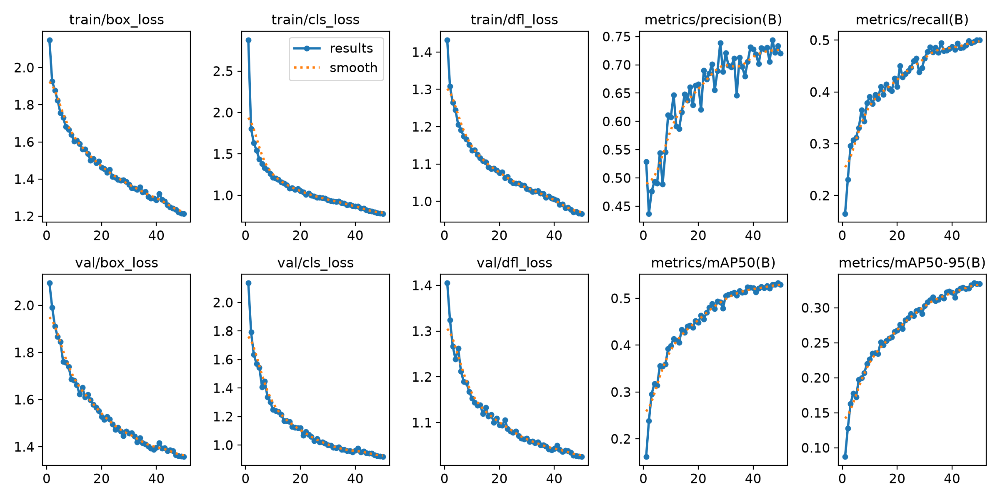

In [36]:
# Training curves (if generated)
from IPython.display import Image, display

results_png = Path(results.save_dir) / "results.png"
if results_png.is_file():
    display(Image(filename=str(results_png), width=700))

## Inference using the fine-tuned-model

In [320]:
import json
import joblib
import random
import cv2
import matplotlib.pyplot as plt

def run_inference_on_frame(test_image, model):
    CONF = 0.25

    predictor = YOLO(str(model), verbose=True).to(device="cuda")
    print("Active YOLO Device:", predictor.device) 

    img_bgr = cv2.imread(str(test_image))
    # img = cv2.cvtColor(cv2.imread(str(TEST_IMAGE)), cv2.COLOR_BGR2RGB)
    h, w = img_bgr.shape[:2]
    pred = predictor.predict(source=img_bgr, conf=CONF, verbose=True, device=0)[0]

    output = []
    names = pred.names
    if pred.boxes is not None:
        for box in pred.boxes:
            cls_id = int(box.cls.item())
            xyxy = box.xyxy[0].cpu().numpy()
            x1, y1, x2, y2 = map(int, xyxy)
            det = {
                "class": names.get(cls_id, str(cls_id)),
                "bbox": (x1, y1, x2, y2),
                "center": ((x1 + x2) / 2, (y1 + y2) / 2),
            }
            output.append({
                "class": det["class"],
                "bbox": [x1, y1, x2, y2],
                "confidence": float(box.conf.item()),
            })
            color = (0, 255, 0)
            cv2.rectangle(img_bgr, (x1, y1), (x2, y2), color, 2)
            cv2.putText(
                img_bgr,
                f"{det['class']}",
                (x1, max(y1 - 8, 0)),
                cv2.FONT_HERSHEY_SIMPLEX,
                0.5,
                color,
                2,
            )

    # print(json.dumps(output, indent=2))
    plt.figure(figsize=(12, 7))
    plt.imshow(cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB))
    # plt.imshow(img)
    plt.title(f"YOLOv8 inference on — {test_image.name}")
    plt.axis("off")
    plt.show()


def resize_and_write_image(img_path, dataset_name):
    resized_img = cv2.resize(cv2.imread(img_path), (960, 540))
    resized_img_name = f"/tmp/{dataset_name}_resized_img.png"
    cv2.imwrite(resized_img_name, resized_img)
    return Path(resized_img_name)

MODEL = "yolov8n.pt"  # yolov8s.pt for more accuracy, slower
BEST_WEIGHTS = Path(os.getcwd()) / "runs" / f"{MODEL[:-3]}_detect" / "weights" / "best.pt"

### On test set

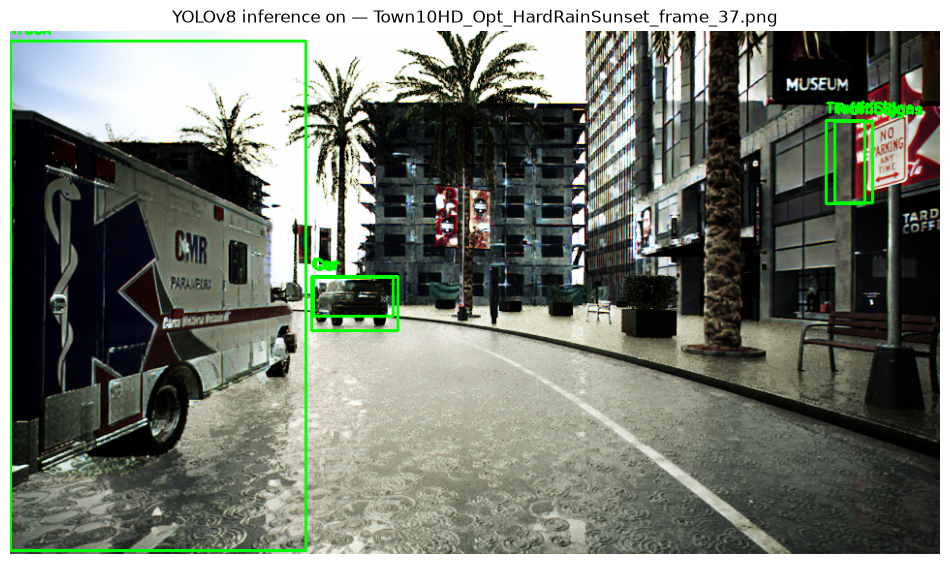

In [ ]:
test_imgs = sorted((Path(YOLO_DATASET) / "test" / "images").glob("*.png"))
test_image = random.choice(test_imgs)
run_inference_on_frame(test_image, BEST_WEIGHTS)

### On Carla native images

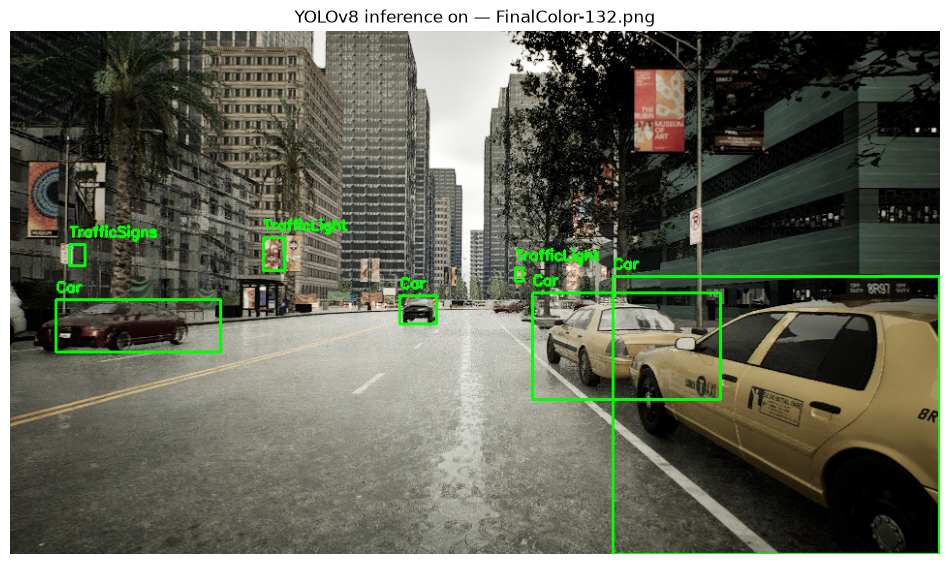

In [55]:
carla_imgs = sorted(Path("../Dataset/Town10HD_Opt_HardRainSunset/Frames").glob("*.png"))
carla_test_image = random.choice(carla_imgs)
run_inference_on_frame(carla_test_image, BEST_WEIGHTS)

### On Kitti real dataset

Using: 006420.png


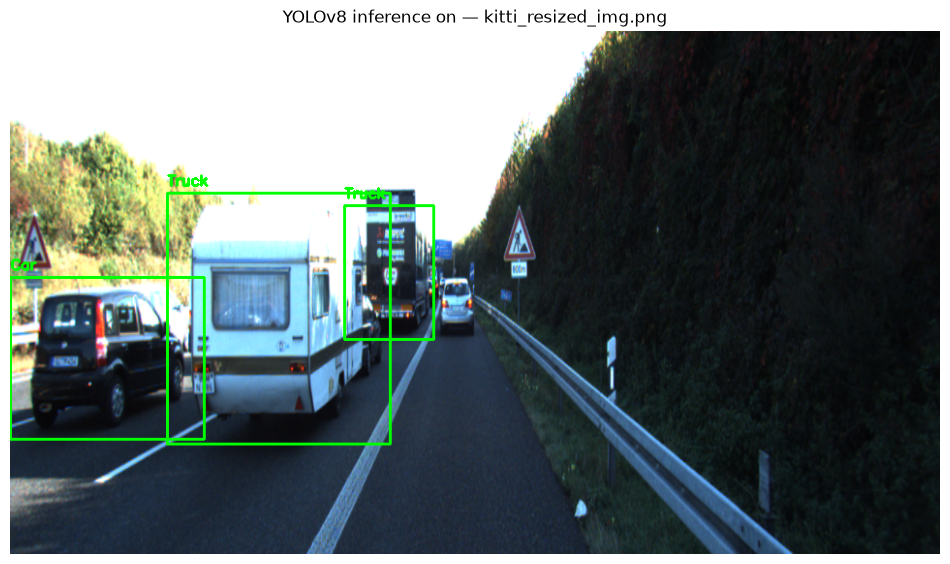

In [291]:
import kagglehub

# Download latest version (7481 images)
kitti_sample_path = kagglehub.dataset_download("ibrahimalobaid/kitte-dataset")
kitti_imgs = sorted(Path(f"{kitti_sample_path}/training/image_2/").glob("*.png"))
kitti_test_image = random.choice(kitti_imgs)
print(f"Using: {kitti_test_image.name}")

run_inference_on_frame(resize_and_write_image(kitti_test_image, "kitti"), BEST_WEIGHTS)

Using: 002915.png


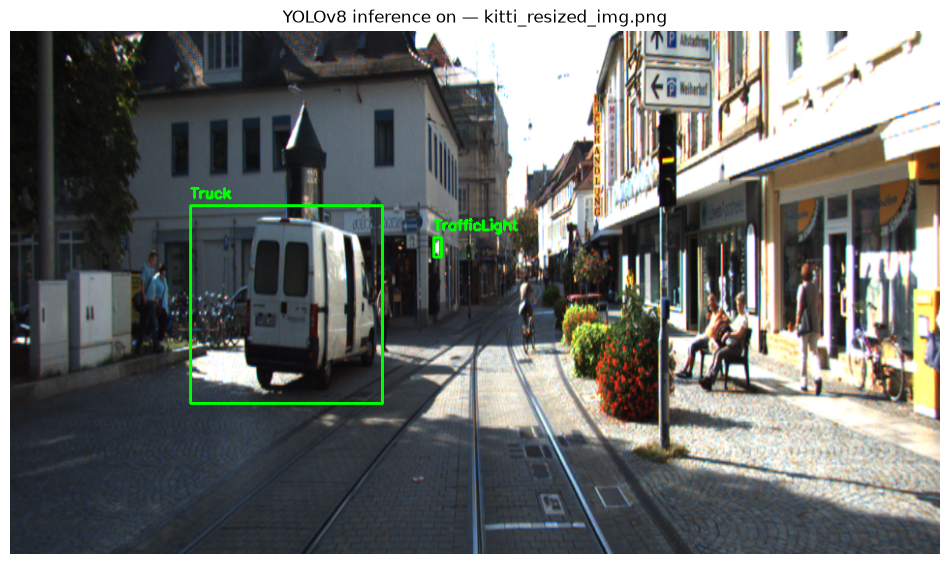

In [242]:
import kagglehub

# Download latest version (7481 images)
kitti_sample_path = kagglehub.dataset_download("ibrahimalobaid/kitte-dataset")
kitti_imgs = sorted(Path(f"{kitti_sample_path}/training/image_2/").glob("*.png"))
kitti_test_image = random.choice(kitti_imgs)
print(f"Using: {kitti_test_image.name}")

run_inference_on_frame(resize_and_write_image(kitti_test_image, "kitti"), BEST_WEIGHTS)

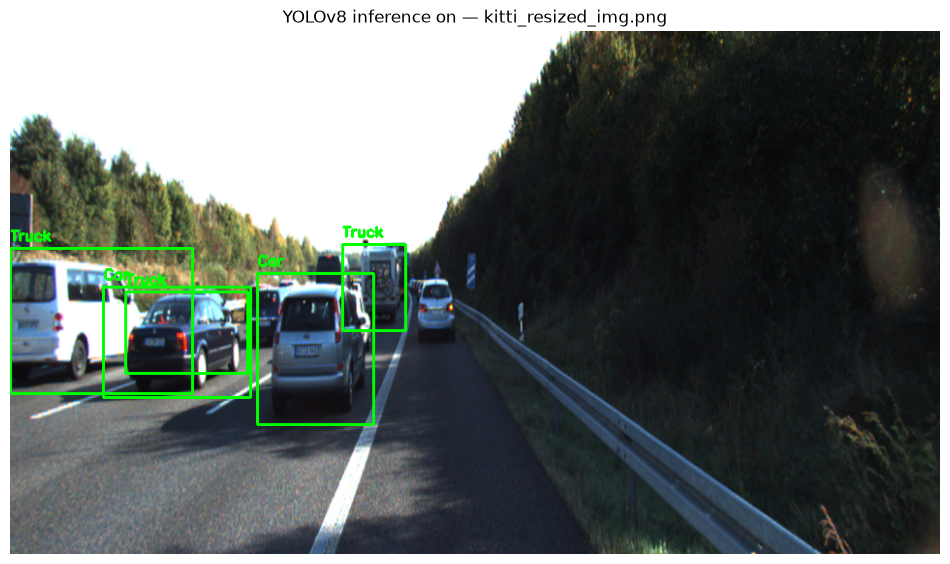

In [ ]:
import kagglehub

# Download latest version (7481 images)
kitti_sample_path = kagglehub.dataset_download("ibrahimalobaid/kitte-dataset")
kitti_imgs = sorted(Path(f"{kitti_sample_path}/training/image_2/").glob("*.png"))
kitti_test_image = random.choice(kitti_imgs)
print(f"Using: {kitti_test_image.name}")

run_inference_on_frame(resize_and_write_image(kitti_test_image, "kitti"), BEST_WEIGHTS)

Using: 002151.png


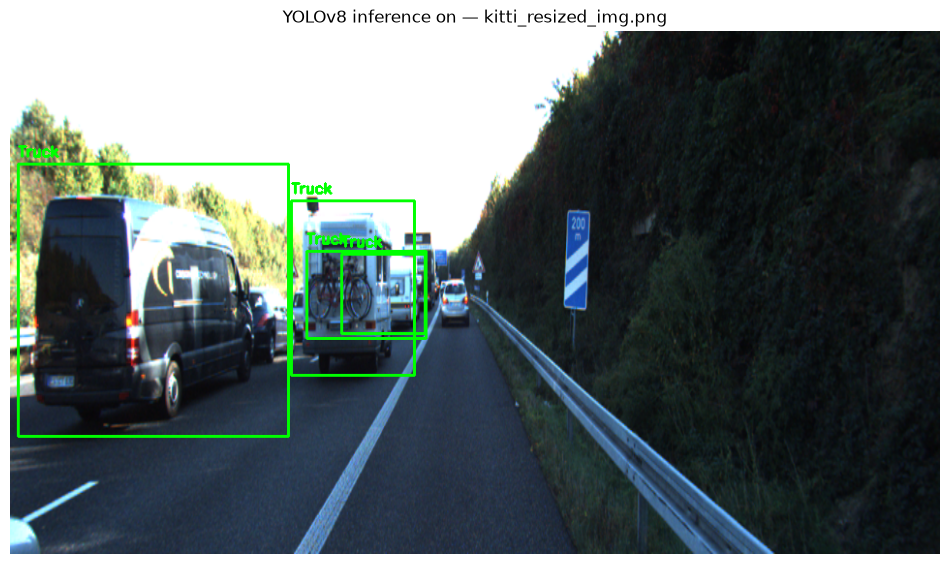

In [181]:
import kagglehub

# Download latest version (7481 images)
kitti_sample_path = kagglehub.dataset_download("ibrahimalobaid/kitte-dataset")
kitti_imgs = sorted(Path(f"{kitti_sample_path}/training/image_2/").glob("*.png"))
kitti_test_image = random.choice(kitti_imgs)
print(f"Using: {kitti_test_image.name}")

run_inference_on_frame(resize_and_write_image(kitti_test_image, "kitti"), BEST_WEIGHTS)

### On CityScapes real dataset

Saving to: /tmp/cityscapes_sample_604.png


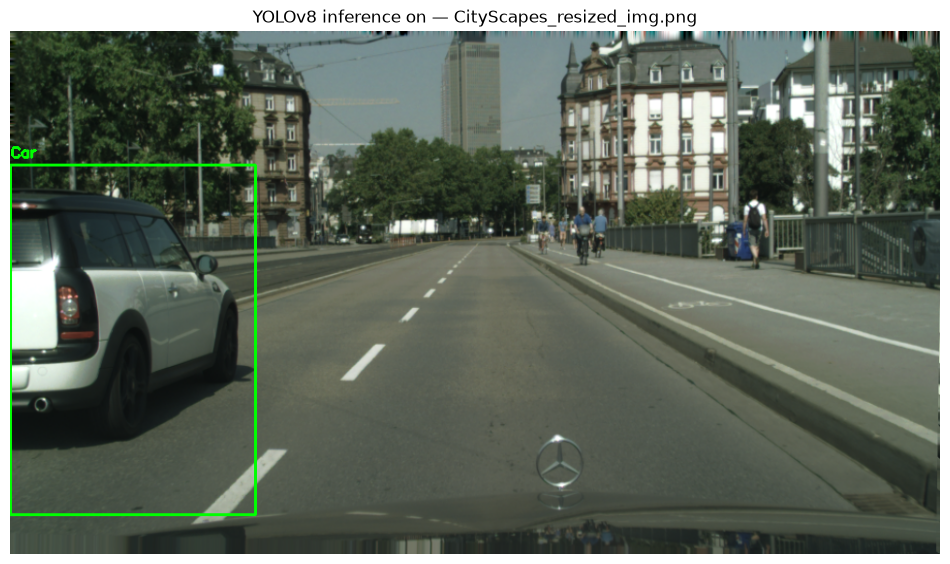

In [ ]:
from datasets import load_dataset
# Make sure to have env var "HF_TOKEN" defined with your access token

# 1. Load the streaming dataset (15,000 images)
ds = load_dataset("yiyi159/cityscapes_sequence_1024by512", split="validation", streaming=True)
# 2. Pick your random target index
image_idx = random.randint(1, 1000)
image_name = f"/tmp/cityscapes_sample_{image_idx}.png"
print(f"Saving to: {image_name}")
# 3. Use .skip() to efficiently advance the stream
skipped_ds = ds.skip(image_idx)
# 4. Extract the immediate next item without a loop
target_row = next(iter(skipped_ds))
image = target_row["image"]
image.save(image_name)

run_inference_on_frame(resize_and_write_image(image_name, "CityScapes"), BEST_WEIGHTS)

Saving to: /tmp/cityscapes_sample_2815.png
Active YOLO Device: cuda:0

0: 384x640 5 Cars, 1 Truck, 6.5ms
Speed: 1.8ms preprocess, 6.5ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)


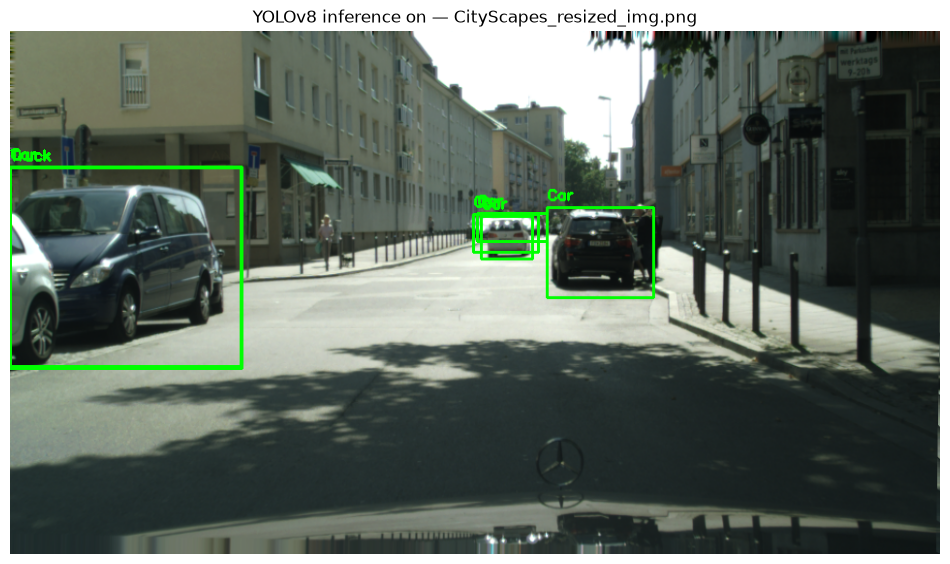

In [322]:
from datasets import load_dataset

# 1. Load the streaming dataset (15,000 images)
ds = load_dataset("yiyi159/cityscapes_sequence_1024by512", split="validation", streaming=True)
# 2. Pick your random target index
image_idx = random.randint(1, 15000)
image_name = f"/tmp/cityscapes_sample_{image_idx}.png"
print(f"Saving to: {image_name}")
# 3. Use .skip() to efficiently advance the stream
skipped_ds = ds.skip(image_idx)
# 4. Extract the immediate next item without a loop
target_row = next(iter(skipped_ds))
image = target_row["image"]
image.save(image_name)

run_inference_on_frame(resize_and_write_image(image_name, "CityScapes"), BEST_WEIGHTS)